# Equazione di Schrödinger

In questo esercizio si vuole risolvere l'equazione di Schrödinger per un elettrone in una scatola di potenziale unidimensionale utilizzando dapprima il metodo di Crank-Nicolson e poi quello spettrale.

## Introduzione

## Operazioni preliminari

Si osserva che per creare animazioni è necessario accedere al sottomodulo `matplotlib.animation`, mentre per visualizzarle in un notebook Jupyter si è scelto di utilizzare il modulo `JSAnimation` disponibile su [github](https://github.com/jakevdp/JSAnimation) (un'altra scelta possibile è l'interfaccia utente per applicazioni web di matplotlib attivabile con `%matplotlib nbagg`).

In [1]:
# importing modules
import numpy as np
import scipy.linalg as la
from math import sin, cos, sqrt, pi
from scipy.constants import hbar, m_e
from scipy.fftpack import dst

import matplotlib.pyplot as plt
# JSAnimation import available at https://github.com/jakevdp/JSAnimation
from JSAnimation import IPython_display
import matplotlib.animation as animation

# display configurations
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)

Inoltre si fissano i valori dei parametri, le unità sono quelle del sistema internazionale.

In [2]:
L = 1e-8
Nx = 1000
xx = np.linspace(0.0,L,Nx)

h = 1e-18
Nt = 2000
tt = h*np.arange(Nt)

Condizioni iniziali

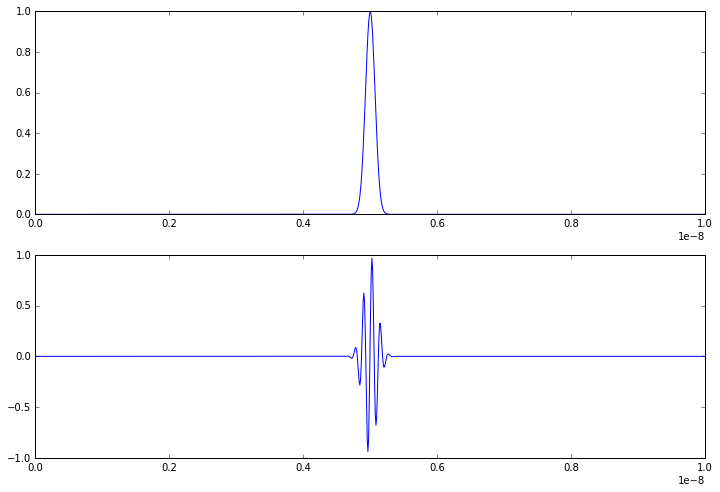

In [3]:
def psiInit(nt,nx,sigma=1e-10,k=5e10,x0=L/2):
    psi = np.empty([nt,nx],dtype=complex)
    xx = np.linspace(0.0,L,nx)
    psi[0,:] = np.exp(-(xx-x0)**2/(2*sigma**2) + 1j*k*xx)
    return psi

psi = psiInit(Nt,Nx)
plt.subplot(211)
plt.plot(xx,np.abs(psi[0,:])**2)
plt.subplot(212)
plt.plot(xx,psi[0,:].real)

## Metodo di Crank-Nicolson

In [4]:
a = L/Nx
d = 0.5*h*hbar/(m_e*a**2)*1j

A = np.empty([3,Nx],dtype=complex)

A[0,0], A[0,1:] = 0, -0.5*d*np.ones(Nx-1)
A[1,:] = (1+d)*np.ones(Nx)
A[2,:-1], A[2,-1] = -0.5*d*np.ones(Nx-1), 0

def stepSource(psi):
    v = np.empty_like(psi)
    v[0], v[-1] = psi[0], psi[-1]
    v[1:-1] = (1-d)*psi[1:-1] + 0.5*d*(psi[:-2]+psi[2:])
    return v

def crankNicolson(psi):
    nt,_ = psi.shape
    for i in range(1,Nt):
        B = stepSource(psi[i-1,])
        psi[i,] = la.solve_banded((1,1),A,B)

In [5]:
psi1 = psiInit(Nt,Nx)
crankNicolson(psi1)

## Animazione del moto del sistema

Infine è possibile visualizzare il risultato grazie al sottomodulo `matplotlib.animation`.


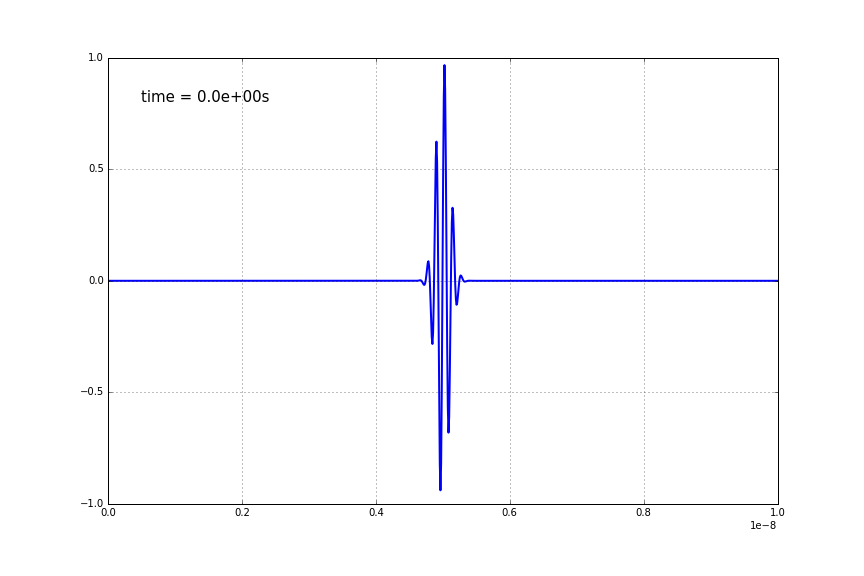
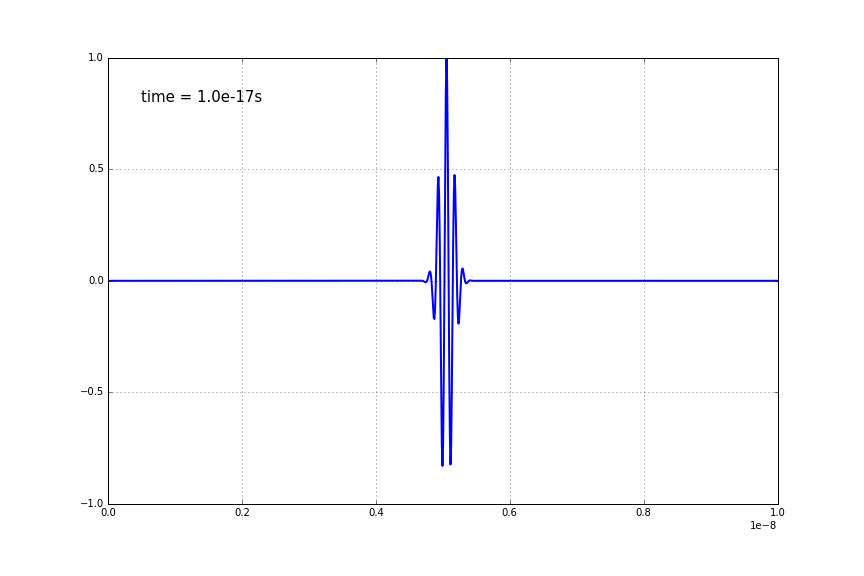
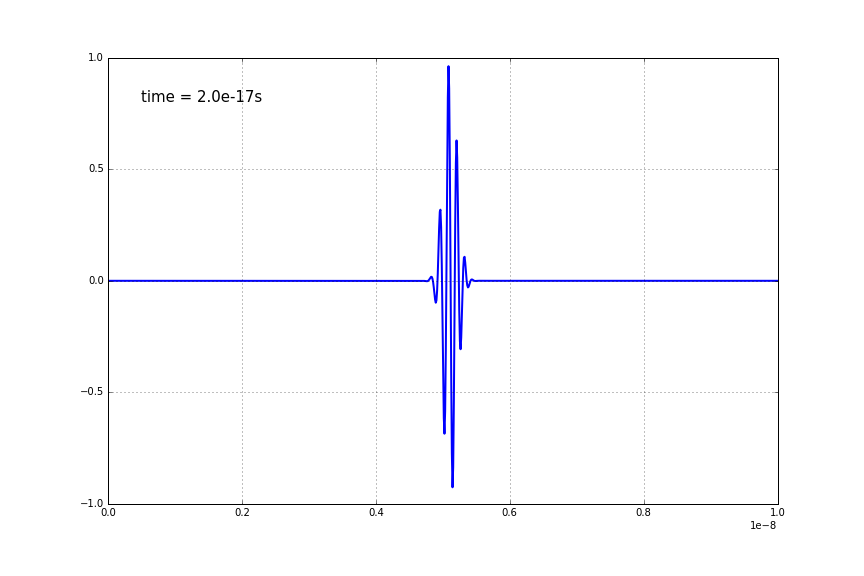
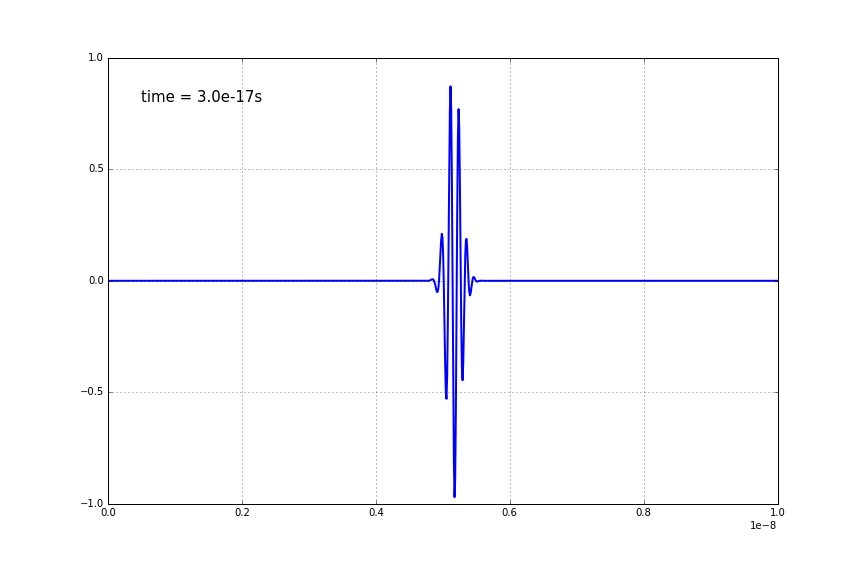
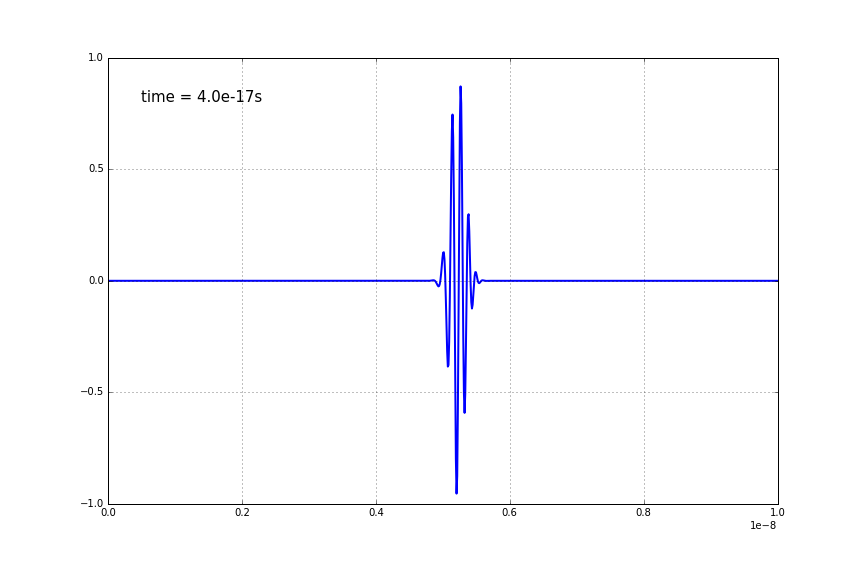
...
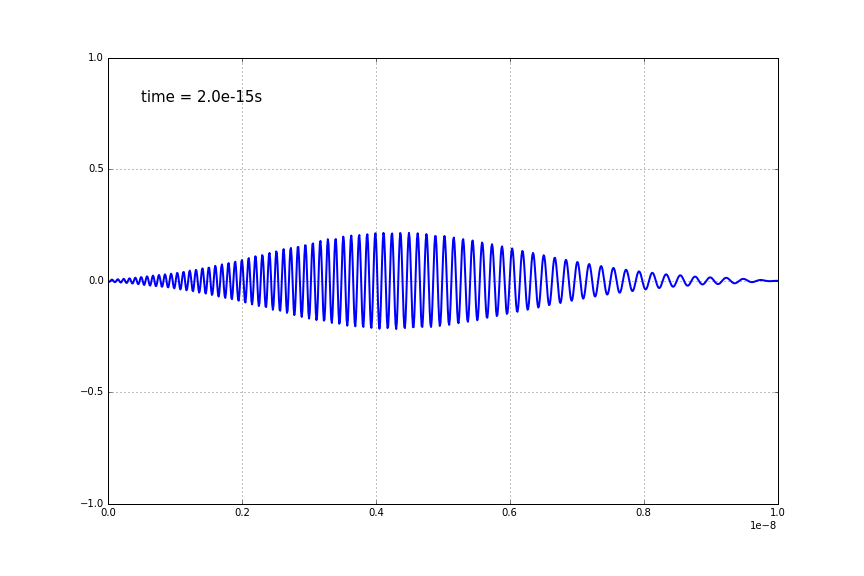
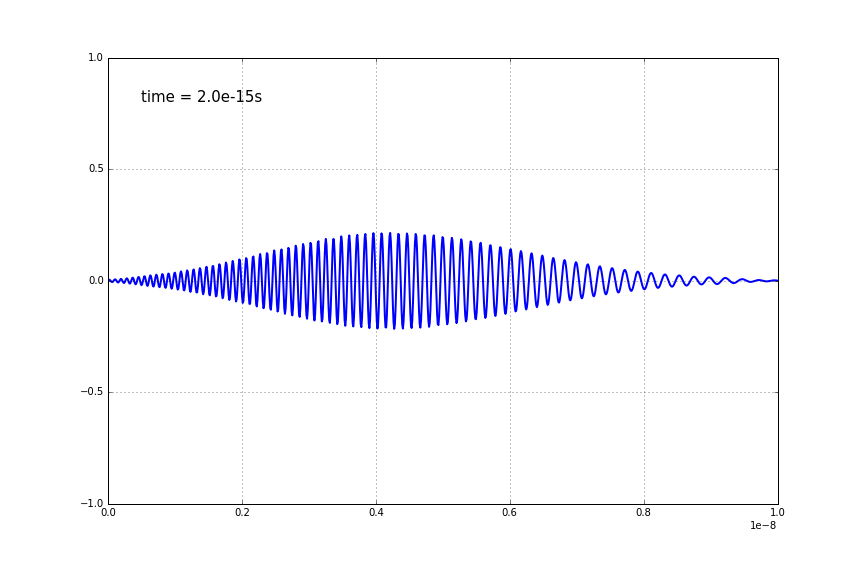
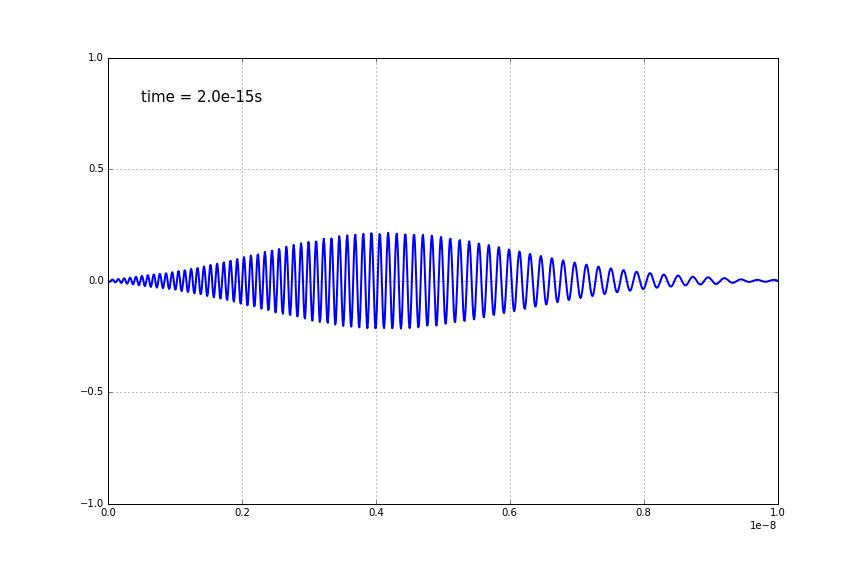
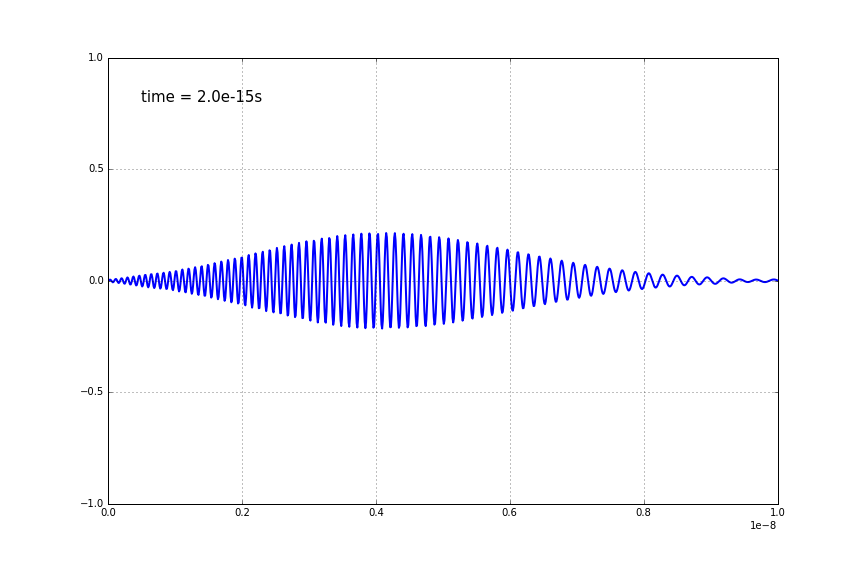
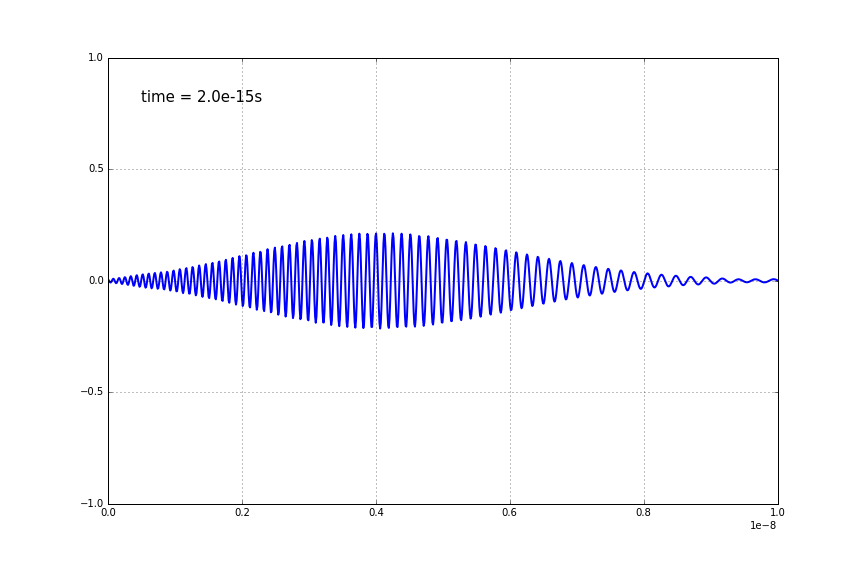

In [12]:
# adapted from http://matplotlib.org/1.4.1/examples/animation/double_pendulum_animated.html

tstep = 10

fig = plt.figure()
ax = fig.add_subplot(111, autoscale_on=False, xlim=(0.0,L), ylim=(-1,1))
ax.grid()

line, = ax.plot([], [], lw=2)
time_template = 'time = %.1es'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes, fontsize=15)

def init():
    line.set_data([], [])
    time_text.set_text('')
    return line, time_text

def animate(i, psi):
    line.set_data(xx,psi1[i,:].real)
    time_text.set_text(time_template % tt[i])
    return line, time_text

animation.FuncAnimation(fig, lambda i: animate(i, psi), range(0,Nt,tstep),
                             interval=50, blit=True, init_func=init)

## Metodo spettrale

In [8]:
def spectrl(psi):
    nt, nx = psi.shape
    y = np.empty([nt,nx-1],dtype=complex)
    y[0,] = psi[0,1:]
    C0 = dst(y[0,],type=1)
    kk = (pi/L)*np.arange(nx-1)
    Mk, Mt = np.meshgrid(kk,tt)
    Ct = C0*np.exp((-0.5j*hbar*Mk**2/m_e)*Mt)
    psi[:,0] = 0.0
    psi[:,1:] = dst(Ct,axis=1,type=1)/(2*Nx)

In [13]:
psi2 = psiInit(Nt,Nx)
spectrl(psi2)

1 loop, best of 3: 396 ms per loop



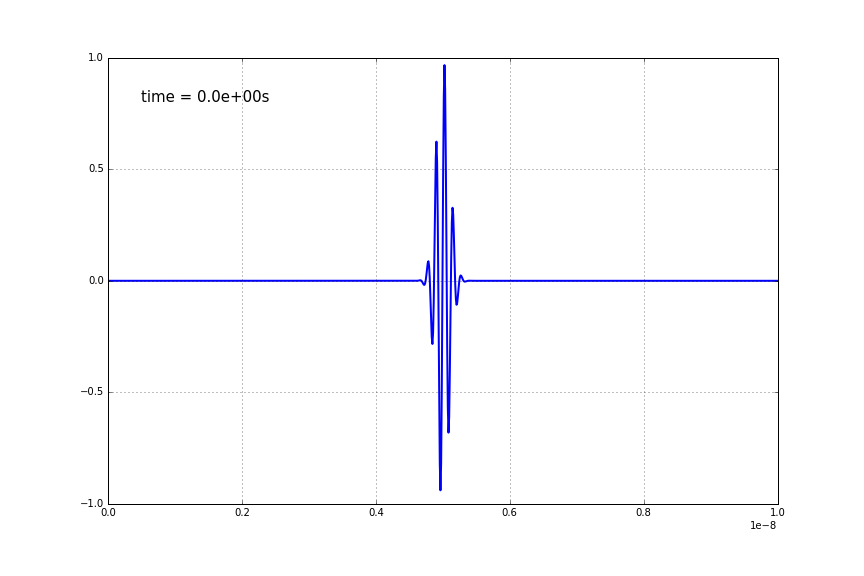
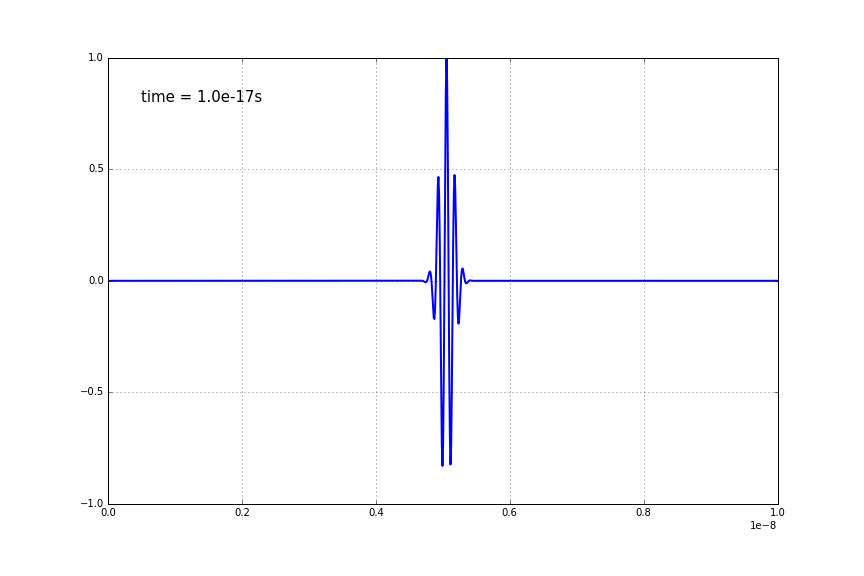
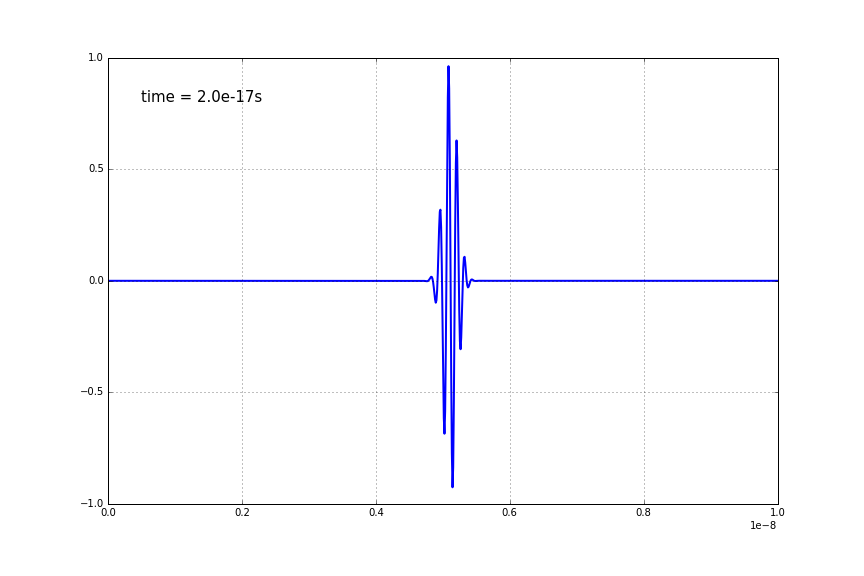
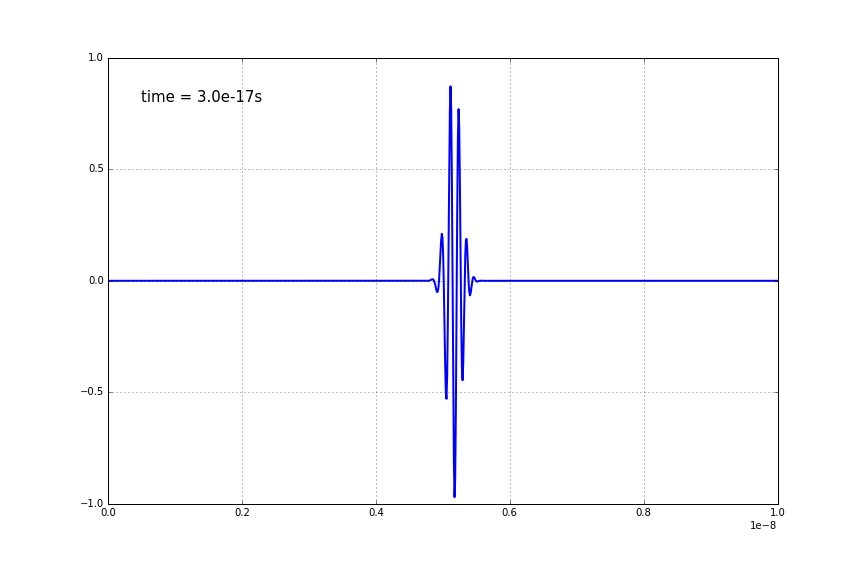
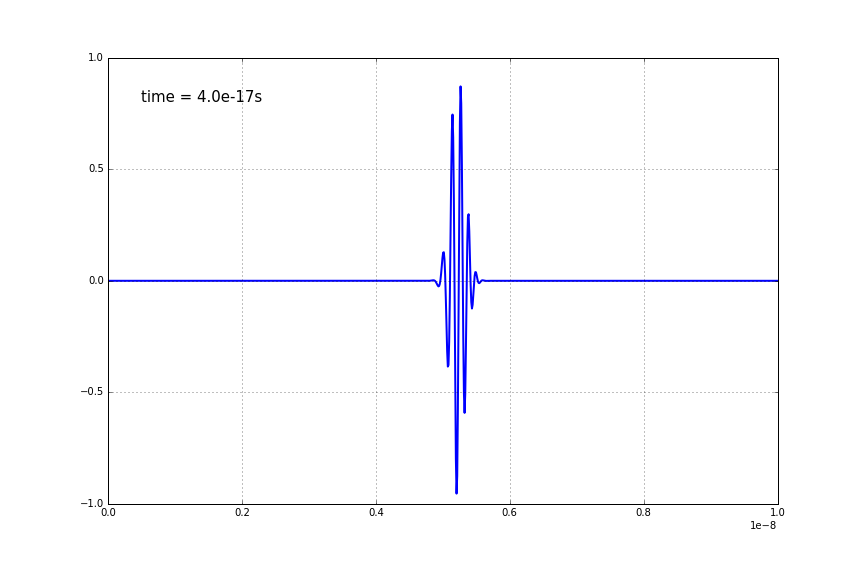
...
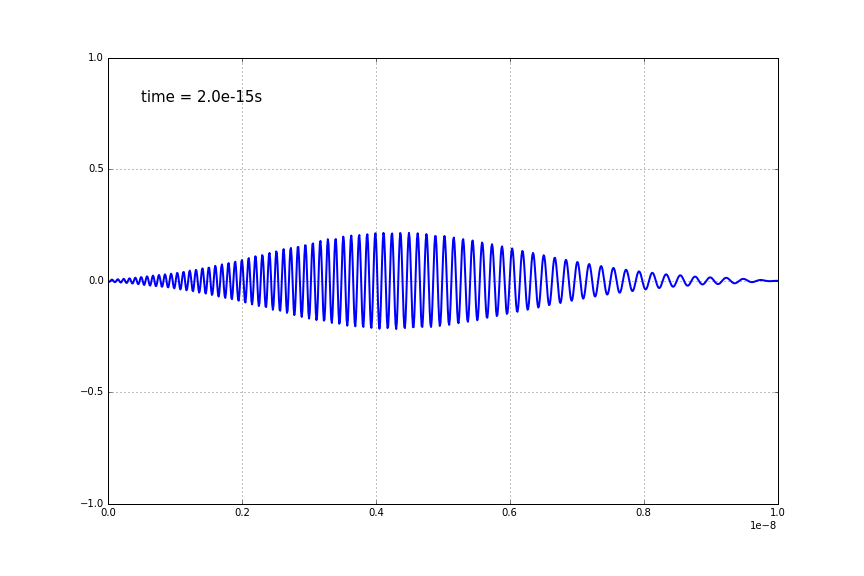
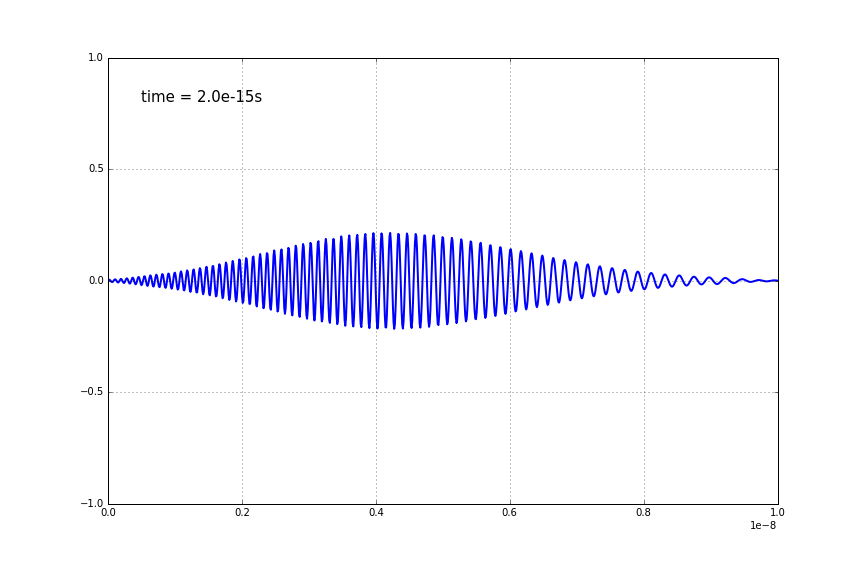
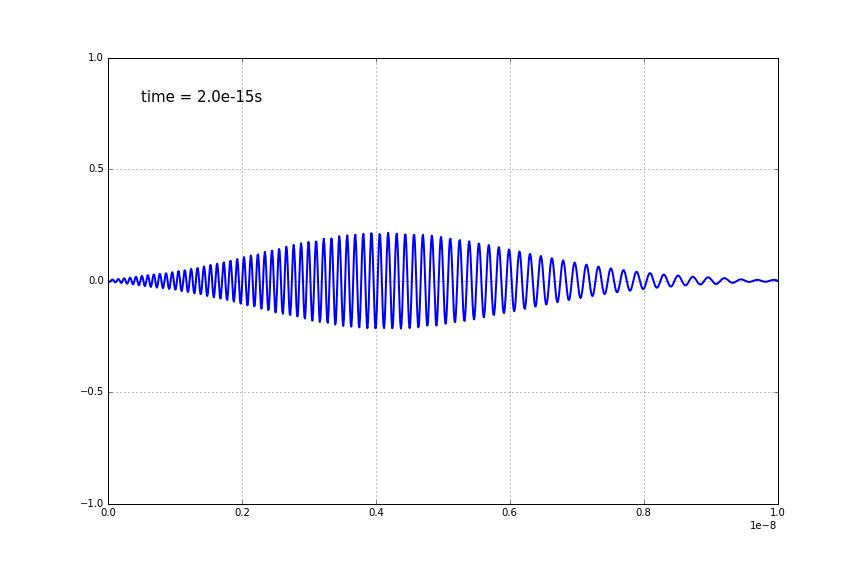
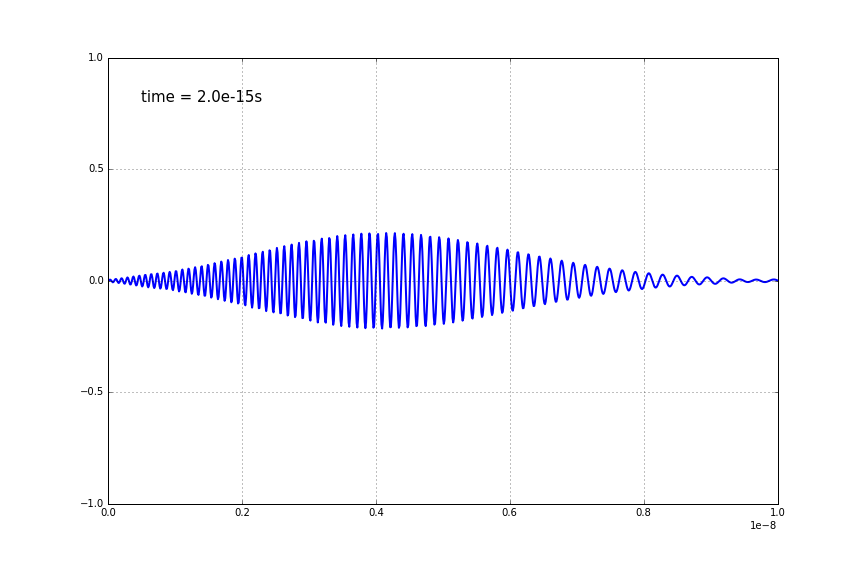
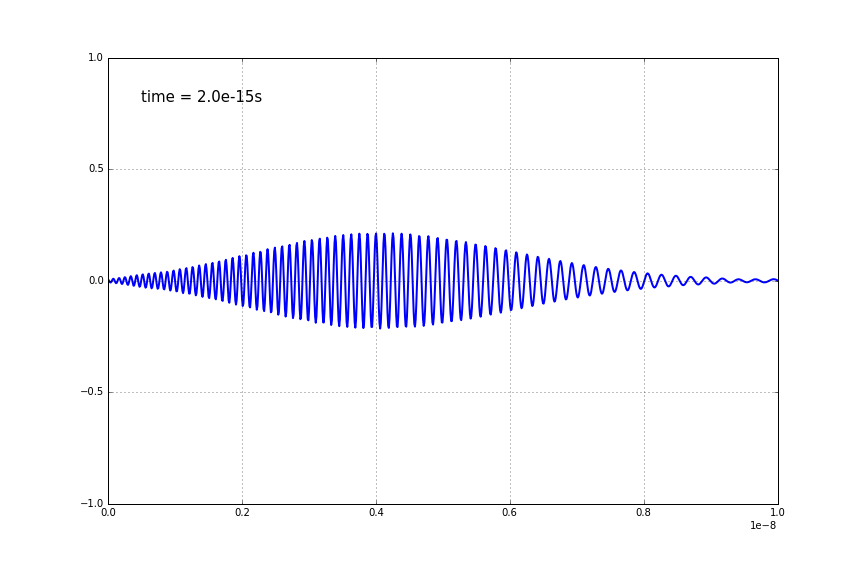

In [10]:
animation.FuncAnimation(fig, lambda i: animate(i,psi2), range(0,Nt,tstep),
                             interval=50, blit=True, init_func=init)